# Lab03-Image Processing and Analysis

In [6]:
"""
Họ Và Tên: Nguyễn Quang Trường
MSSV: 21110429
Lab_03 Phân Tích Và Xử Lý Ảnh
"""

'\nHọ Và Tên: Nguyễn Quang Trường\nMSSV: 21110429\nLab_03 Phân Tích Và Xử Lý Ảnh\n'

In [1]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

## Bài 1: Tìm 1 ảnh trên internet và thực hiện các thao tác sau 

### Làm mờ ảnh với các kernel 3x3 và 5x5 

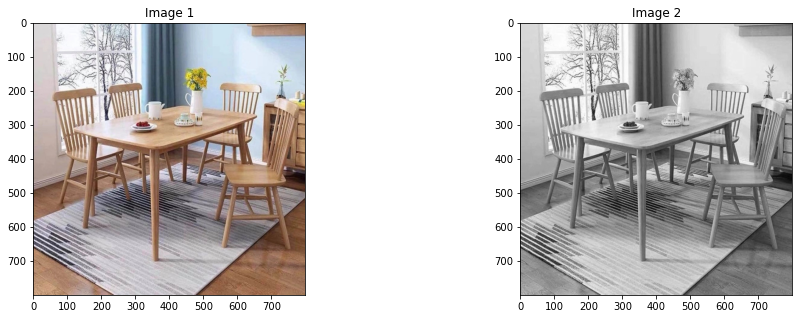

In [3]:
# Read Image 
image_color = imread("room.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

Làm mờ ảnh với kernel 3x3 và 5x5

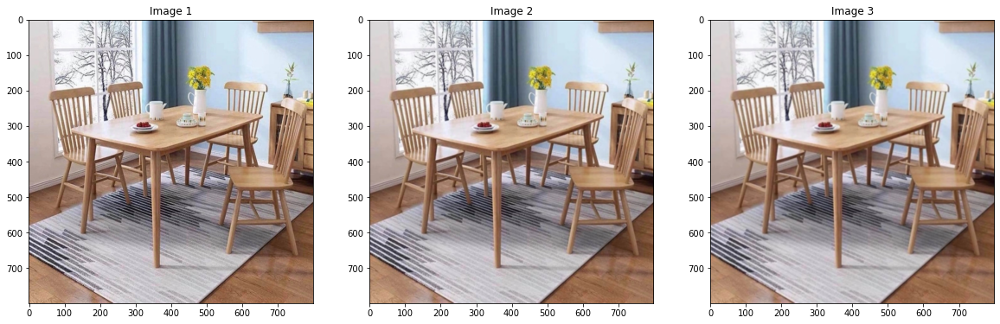

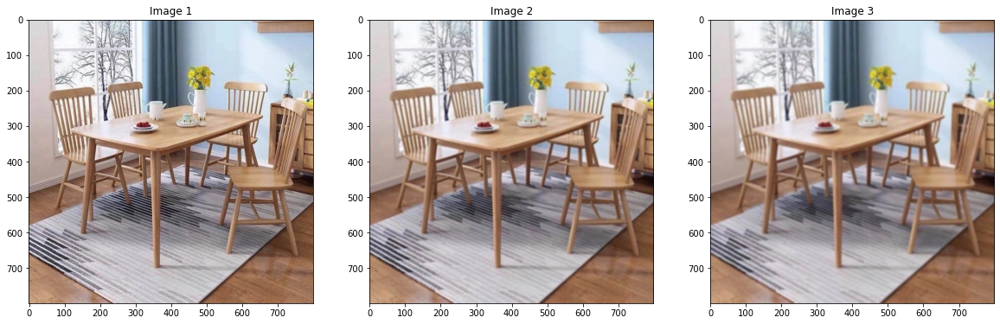

In [4]:
kernel_3_3 = np.ones((3,3),np.float32)/9
kernel_5_5 = np.ones((5,5),np.float32)/25

image_filter_3_3_01 = cv2.filter2D(image_color,-1,kernel_3_3)
image_filter_3_3_02 = cv2.filter2D(image_filter_3_3_01,-1,kernel_3_3)

image_filter_5_5_01 = cv2.filter2D(image_color,-1,kernel_5_5)
image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01,-1,kernel_5_5)

ShowThreeImages(image_color, image_filter_3_3_01, image_filter_3_3_02)
ShowThreeImages(image_color, image_filter_5_5_01, image_filter_5_5_02)

### Xuất giá trị đo mức độ mờ 

In [5]:
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

xuất độ đo mờ sau khi dùng kernel 3x3

In [6]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)
blur_mesurement_3_3_02 = variance_of_laplacian(image_filter_3_3_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_3_3_01:", blur_mesurement_3_3_01)
print("Blur Measurement of image_filter_3_3_02:", blur_mesurement_3_3_02)

Blur Measurement of image_color: 761.7312198173819
Blur Measurement of image_filter_3_3_01: 118.74338714124887
Blur Measurement of image_filter_3_3_02: 50.107086871842185


Xuất độ đo mờ sau khi dùng kernel 5x5

In [7]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
blur_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_5_5_01:", blur_mesurement_5_5_01)
print("Blur Measurement of image_filter_5_5_02:", blur_mesurement_5_5_02)

Blur Measurement of image_color: 761.7312198173819
Blur Measurement of image_filter_5_5_01: 30.589615439920767
Blur Measurement of image_filter_5_5_02: 9.488121191236708


### Viết dòng thông tin về giá trị mức độ mờ trên ảnh 

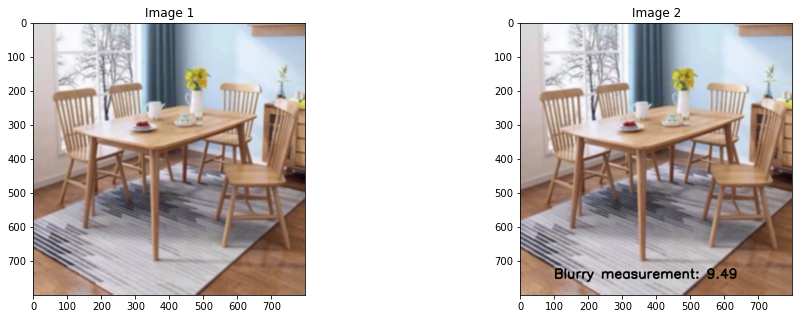

In [8]:
text = "Blurry measurement"
fm = blur_mesurement_5_5_02
image_filter_5_5_02_text = image_filter_5_5_02.copy()
cv2.putText(image_filter_5_5_02_text, "{}: {:.2f}".format(text, fm), (100, 750), cv2.FONT_HERSHEY_SIMPLEX, 1.3, (0,0, 0), 3)
ShowTwoImages(image_filter_5_5_02, image_filter_5_5_02_text)

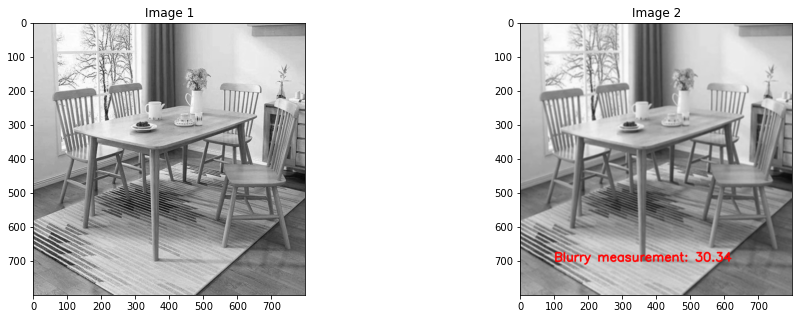

In [9]:
image_gray_filter = cv2.filter2D(image_gray,-1,kernel_5_5)
image_gray_filter_color = cv2.cvtColor(image_gray_filter, cv2.COLOR_GRAY2RGB)

text = "Blurry measurement"
fm = variance_of_laplacian(image_gray_filter)
cv2.putText(image_gray_filter_color, "{}: {:.2f}".format(text, fm), (100,700), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 5, 5), 3)
ShowTwoImages(image_gray, image_gray_filter_color)

## Bài 2:Tìm 1 ảnh trên internet và thực hiện các thao tác sau 

In [10]:
image_color = imread("image02.jpg")
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)


### Làm rõ ảnh với các kernel 3x3 và 5x5 

Dùng kernel 3x3 làm rõ ảnh

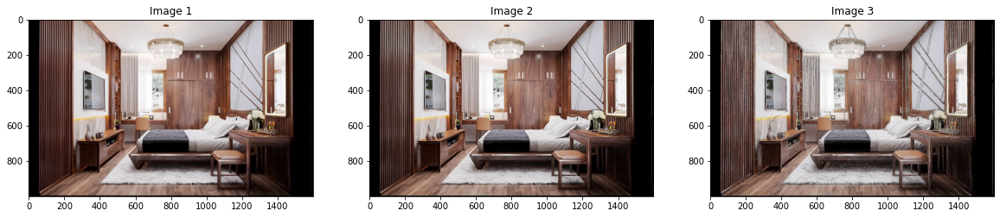

In [11]:
kernel_3_3 = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])

image_filter_3_3_01 = cv2.filter2D(image_color,-1,kernel_3_3)
image_filter_3_3_02 = cv2.filter2D(image_filter_3_3_01,-1,kernel_3_3)


ShowThreeImages(image_color, image_filter_3_3_01, image_filter_3_3_02)


Xuất độ đo rõ

In [12]:
sharp_mesurement = variance_of_laplacian(image_color)
sharp_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)
sharp_mesurement_3_3_02 = variance_of_laplacian(image_filter_3_3_02)
print("Sharp Measurement of image_color:", sharp_mesurement)
print("Sharp Measurement of image_filter_3_3_01:",sharp_mesurement_3_3_01)
print("Sharp Measurement of image_filter_3_3_02:",sharp_mesurement_3_3_02)

Sharp Measurement of image_color: 672.5499002629373
Sharp Measurement of image_filter_3_3_01: 7181.188625588343
Sharp Measurement of image_filter_3_3_02: 49910.2628736823


Viết dòng thông tin lên ảnh

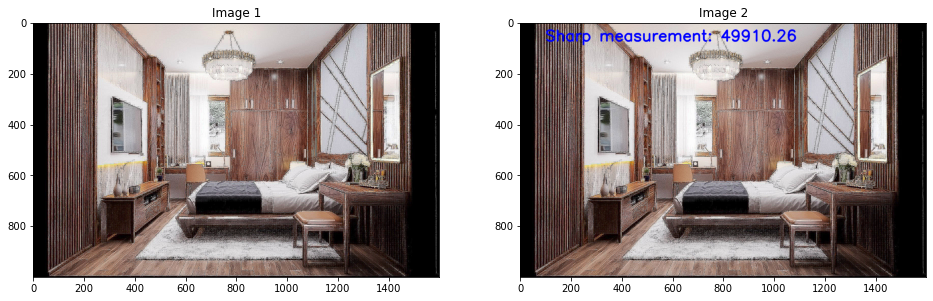

In [13]:
text = "Sharp measurement"
fm = sharp_mesurement_3_3_02
image_filter_3_3_02_text = image_filter_3_3_02.copy()
cv2.putText(image_filter_3_3_02_text, "{}: {:.2f}".format(text, fm), (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0, 255), 5)
ShowTwoImages(image_filter_3_3_02, image_filter_3_3_02_text)

Dùng kernel 5x5 làm rõ ảnh

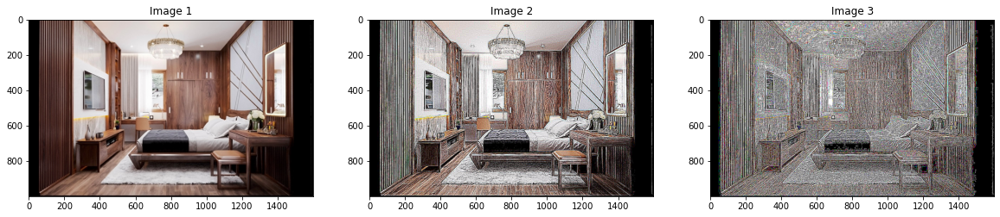

In [14]:

kernel_5_5 = np.array([[-1, -1, -1, -1, -1],
                       [-1, -1, -1, -1, -1],
                       [-1, -1, 25, -1, -1],
                       [-1, -1, -1, -1, -1],
                       [-1, -1, -1, -1, -1]])

image_filter_5_5_01 = cv2.filter2D(image_color,-1,kernel_5_5)
image_filter_5_5_02 = cv2.filter2D(image_filter_5_5_01,-1,kernel_5_5)
ShowThreeImages(image_color, image_filter_5_5_01, image_filter_5_5_02)

Xuất Độ đo làm rõ ảnh

In [15]:
sharp_mesurement = variance_of_laplacian(image_color)
sharp_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
sharp_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)
print("Sharp Measurement of image_color:", blur_mesurement)
print("Sharp Measurement of image_filter_5_5_01:", sharp_mesurement_5_5_01)
print("Sharp Measurement of image_filter_5_5_02:", sharp_mesurement_5_5_02)

Sharp Measurement of image_color: 761.7312198173819
Sharp Measurement of image_filter_5_5_01: 32671.047043199036
Sharp Measurement of image_filter_5_5_02: 109967.02524819647


Viết dòng thông tin lên ảnh

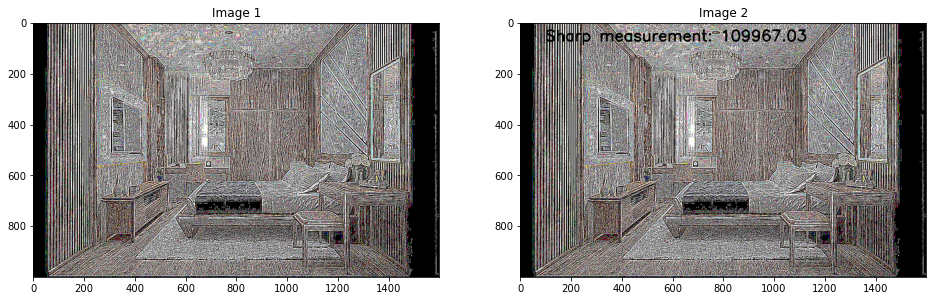

In [16]:
text = "Sharp measurement"
fm = sharp_mesurement_5_5_02
image_filter_5_5_02_text = image_filter_5_5_02.copy()
cv2.putText(image_filter_5_5_02_text, "{}: {:.2f}".format(text, fm), (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0, 0), 5)
ShowTwoImages(image_filter_5_5_02, image_filter_5_5_02_text)

Viết dòng thông tin lên ảnh xám của kernel 5x5

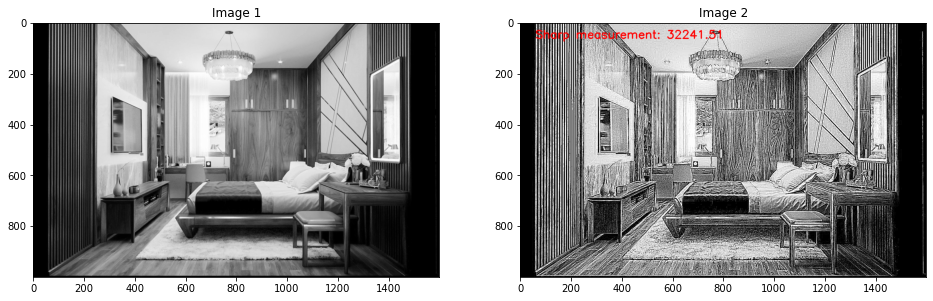

In [17]:
image_gray_filter = cv2.filter2D(image_gray,-1,kernel_5_5)
image_gray_filter_color = cv2.cvtColor(image_gray_filter, cv2.COLOR_GRAY2RGB)

text = "Sharp measurement"
fm = variance_of_laplacian(image_gray_filter)
cv2.putText(image_gray_filter_color, "{}: {:.2f}".format(text, fm), (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 3)
ShowTwoImages(image_gray, image_gray_filter_color)

## Bài 3: một thư mục ảnh gồm 5 ảnh 

### Viết hàm đọc toàn bộ ảnh trong thư mục “Image_Input” đó vào một List ảnh 

In [18]:
import os

def Image_Input(path):
    
    list_image=list()
    for i in os.listdir(path):
        if i.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(path, i)
            image = imread(image_path)
            list_image.append(image)
    return list_image

In [19]:
list_image=Image_Input("Image")

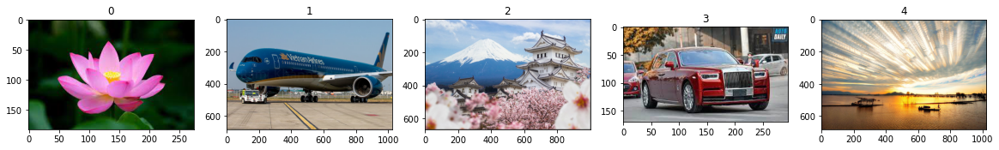

In [20]:
ShowListImages(list_image,1,5)

### Định nghĩa ngưỡng mờ dựa trên giá độ đo mờ

In [21]:
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

In [22]:
def check_image_Blur(image, threshold):
    
    laplacian_var= variance_of_laplacian(image)
    
    return laplacian_var < threshold

### 	Đọc lần lượt các ảnh : nếu ảnh nào ngoài ngưỡng mờ ta ghi một dòng thông tin trên ảnh là “Blur Image :” kèm giá trị mờ. Nếu ảnh nào tốt thì ta ghi “Good Image” trên ảnh. 	Tất cả các ảnh sau khi đánh giá được lưu vào một thư mục “Image_BlurDetection_Output”v

In [26]:
from PIL import Image

folder_path = "Image_BlurDetection_Output"
os.makedirs(folder_path, exist_ok=True)

threshold=1000

for i, image in enumerate(list_image):
    if check_image_Blur(image,threshold):
        text = "Blur Image"        
    else:
        text = "Good Image"
    
    fm = variance_of_laplacian(image)
    image_text = image.copy()
    cv2.putText(image_text, "{}: {:.2f}".format(text, fm), (10, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,0, 0), 2)

    new_image_name = "Image_"+ str(i)+".jpg"
    image_pillow = Image.fromarray(image_text) 
    new_image_path = os.path.join(folder_path, new_image_name)
    image_pillow.save(new_image_path)
        
        


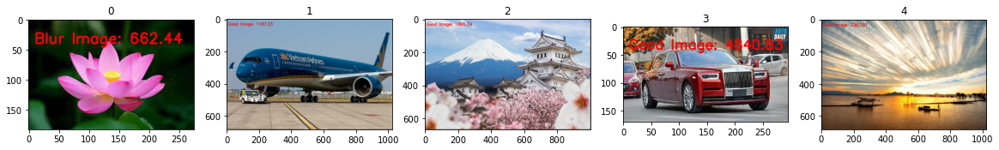

In [27]:
# Read image form folder Image_BlurDectection_Output 
list2_image=Image_Input("Image_BlurDetection_Output")
ShowListImages(list2_image,1,5)

## Bài 4: Tìm 1 ảnh trên Internet và thực hiện các bước sau :

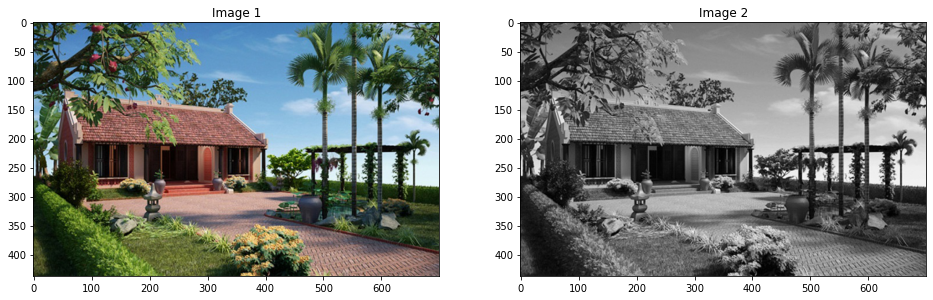

In [28]:
# Read Image 
image_color = imread("Nha.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

### Xuất ảnh từng điểm ảnh hiển thị giá trị RGBMax 

In [29]:
def max_rgb_filter(image):
    # split the image into its BGR components
    (B, G, R) = cv2.split(image)
    # find the maximum pixel intensity values for each
    # (x, y)-coordinate,, then set all pixel values less
    # than M to zero
    M = np.maximum(np.maximum(R, G), B)
    R[R < M] = 0
    G[G < M] = 0
    B[B < M] = 0
    # merge the channels back together and return the image
    return cv2.merge([B, G, R])

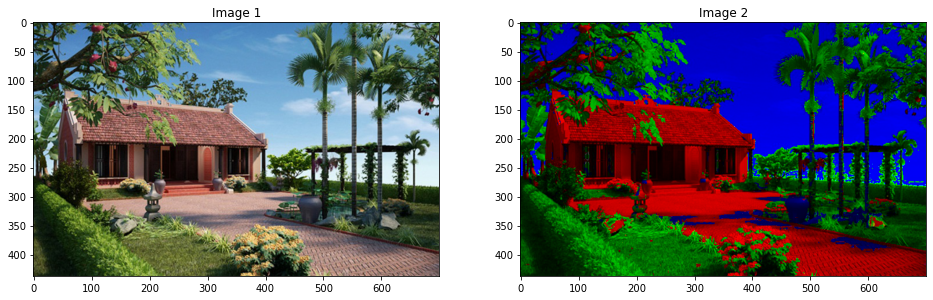

In [30]:
image_color_rgbmax = max_rgb_filter(image_color)
ShowTwoImages(image_color, image_color_rgbmax)

### Xuất các vị trí có giá trị R đạt max, G đạt max và B đạt max

In [31]:
def SegmentColorImageByMask(IM, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

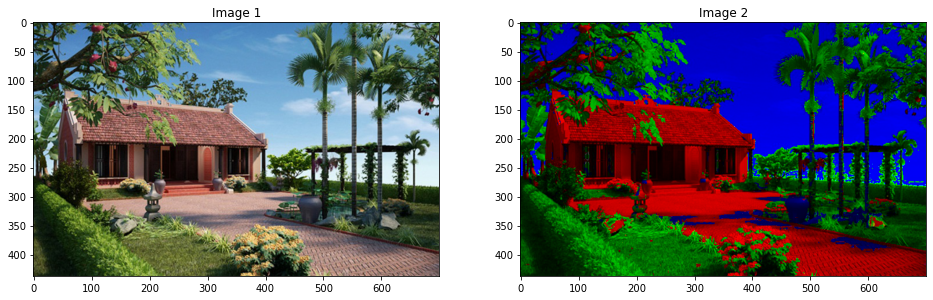

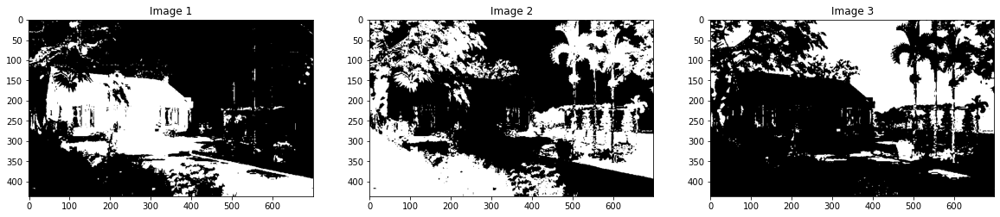

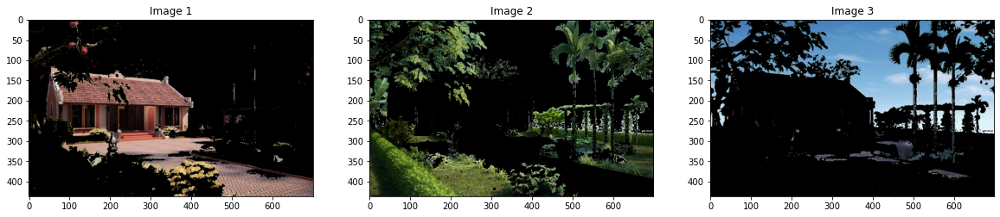

In [32]:
image_maxR_mask = image_gray < 0
image_maxG_mask = image_gray < 0
image_maxB_mask = image_gray < 0

R = image_color_rgbmax[:,:,0]
G = image_color_rgbmax[:,:,1]
B = image_color_rgbmax[:,:,2]

image_maxR_mask[(G == 0) & (B == 0)] = 1
image_maxG_mask[(R == 0) & (B == 0)] = 1
image_maxB_mask[(G == 0) & (R == 0)] = 1

image_maxR = SegmentColorImageByMask(image_color, image_maxR_mask)
image_maxG = SegmentColorImageByMask(image_color, image_maxG_mask)
image_maxB = SegmentColorImageByMask(image_color, image_maxB_mask)

ShowTwoImages(image_color, image_color_rgbmax)
ShowThreeImages(image_maxR_mask, image_maxG_mask, image_maxB_mask)
ShowThreeImages(image_maxR, image_maxG, image_maxB)

### Thưc hiện làm mờ ảnh rồi sau đó làm rõ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không 

In [35]:
# Read Image 
image_color = imread("People_animal.jpg")
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)



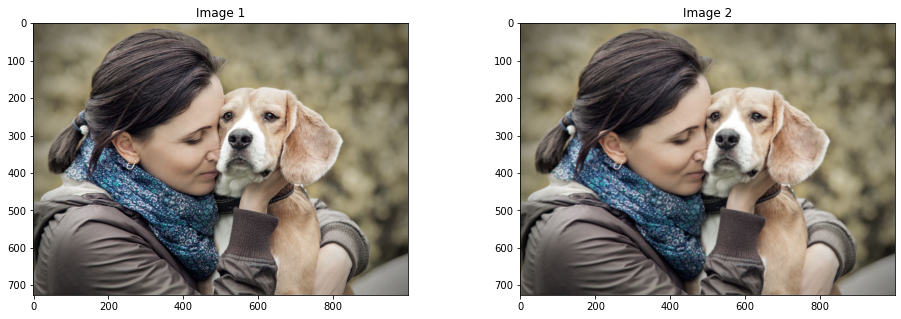

In [37]:
kernel_3_3 = np.ones((3,3),np.float32)/9

image_filter_3_3_01 = cv2.filter2D(image_color,-1,kernel_3_3) 
ShowTwoImages(image_color, image_filter_3_3_01)

In [38]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)

print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_3_3_01:", blur_mesurement_3_3_01)


Blur Measurement of image_color: 665.4534150350314
Blur Measurement of image_filter_3_3_01: 60.14609457840024


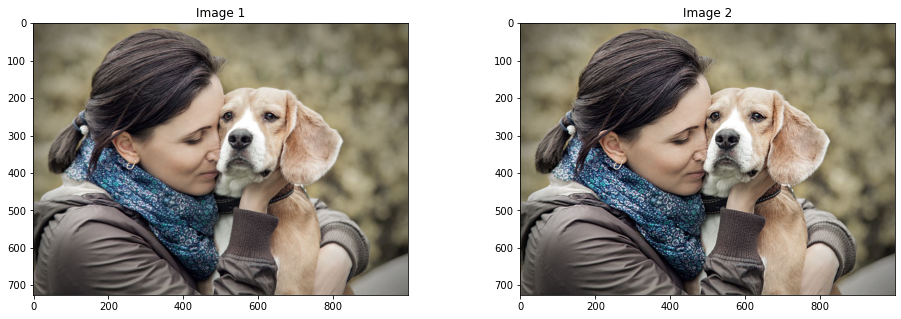

In [40]:
kernel_3_3 = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]],dtype="int")

image_filter_3_3_001 = cv2.filter2D(image_filter_3_3_01,-1,kernel_3_3)



ShowTwoImages(image_color, image_filter_3_3_001) 

In [41]:
sharp_mesurement = variance_of_laplacian(image_color)
sharp_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_001)

print("Sharp Measurement of image_color:", sharp_mesurement)
print("Sharp Measurement of image_filter_3_3_01:",sharp_mesurement_3_3_01)


Sharp Measurement of image_color: 665.4534150350314
Sharp Measurement of image_filter_3_3_01: 551.2828488409849


Sau khi làm mờ ảnh rồi từ ảnh mờ đó làm rõ ảnh lại thì thấy độ đo của ảnh phục hồi lại có độ đo tuy không giống với ảnh ban đầu nhưng có độ đo gần với độ đo của ảnh ban đầu

###  Thưc hiện làm rõ ảnh rồi sau đó làm mờ ảnh và so sánh giá trị độ đo mờ có giống ảnh gốc không

In [44]:
# Read Image 
image_color = imread("dog_people.jpg")
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

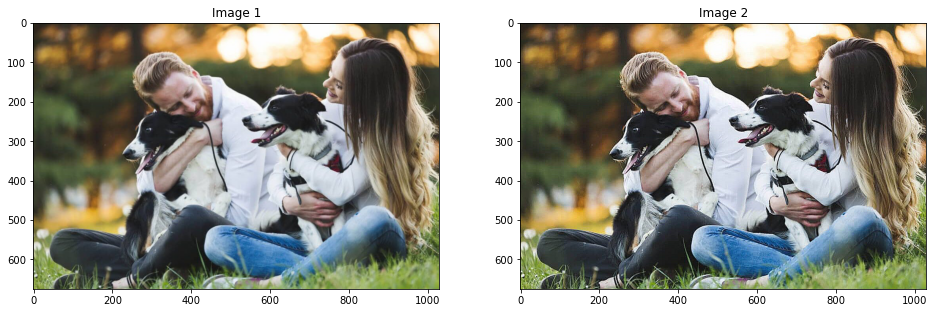

In [45]:
kernel_3_3 = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]],dtype="int")

image_filter_3_3_001 = cv2.filter2D(image_color,-1,kernel_3_3)

ShowTwoImages(image_color, image_filter_3_3_001)

In [46]:
sharp_mesurement = variance_of_laplacian(image_color)
sharp_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_001)

print("Sharp Measurement of image_color:", sharp_mesurement)
print("Sharp Measurement of image_filter_3_3_01:",sharp_mesurement_3_3_01)


Sharp Measurement of image_color: 204.81551522532067
Sharp Measurement of image_filter_3_3_01: 2942.7203016194503


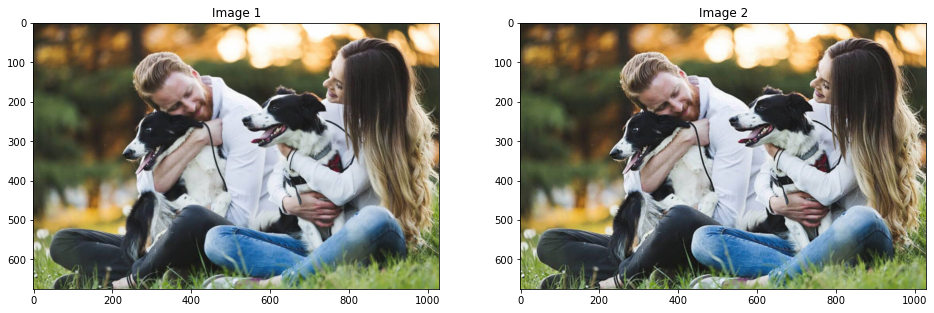

In [47]:
kernel_3_3 = np.ones((3,3),np.float32)/9

image_filter_3_3_01 = cv2.filter2D(image_filter_3_3_001,-1,kernel_3_3)

ShowTwoImages(image_color, image_filter_3_3_01)

In [48]:
blur_mesurement = variance_of_laplacian(image_color)
blur_mesurement_3_3_01 = variance_of_laplacian(image_filter_3_3_01)

print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_3_3_01:", blur_mesurement_3_3_01)



Blur Measurement of image_color: 204.81551522532067
Blur Measurement of image_filter_3_3_01: 193.50125226818773


Sau khi làm rõ ảnh và từ ảnh đó làm mờ lại thì độ đo của ảnh tuy không có độ đo giống với ảnh gốc nhưng có độ đo gần với độ đo ban đầu

### Tìm cạnh và tạo ra các ảnh về cạnh sau : ảnh cạnh ngang, cạnh dọc và ảnh cạnh tổng Tìm cạnh và tạo ra các ảnh về cạnh sau : ảnh cạnh ngang, cạnh dọc và ảnh cạnh tổng 

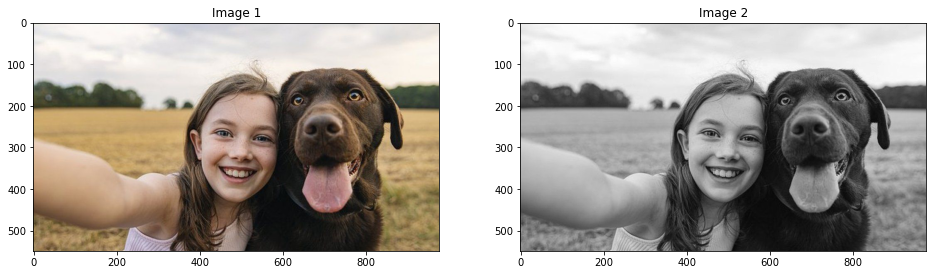

In [49]:
# Read Image 
image_color = imread("animal_people.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

In [50]:
# construct the Laplacian kernel used to detect edge-like
# regions of an image
# construct the Sobel x-axis kernel
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")
 
# construct the Sobel y-axis kernel
kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

Ảnh Cạnh Dọc

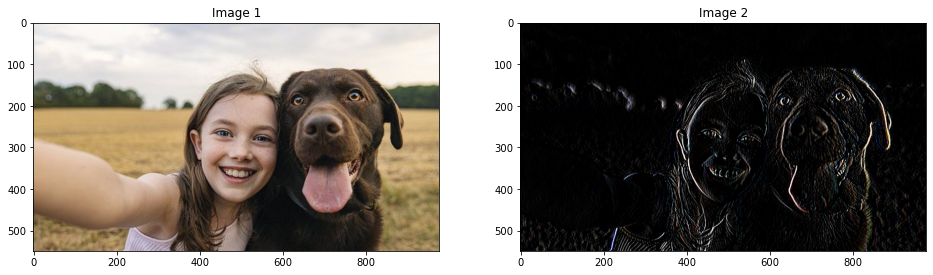

In [56]:
image_color_edge_sobelX = cv2.filter2D(image_color, -1, kernel_sobelX)

ShowTwoImages(image_color,image_color_edge_sobelX)

Ảnh Cạnh Ngang

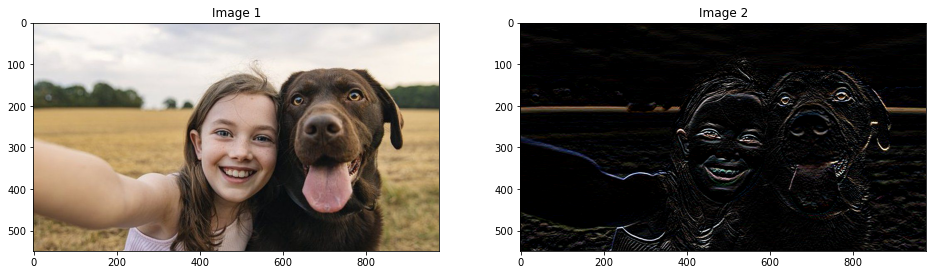

In [57]:
image_color_edge_sobelY = cv2.filter2D(image_color, -1, kernel_sobelY)
ShowTwoImages(image_color, image_color_edge_sobelY)

Ảnh Cạnh Tổng

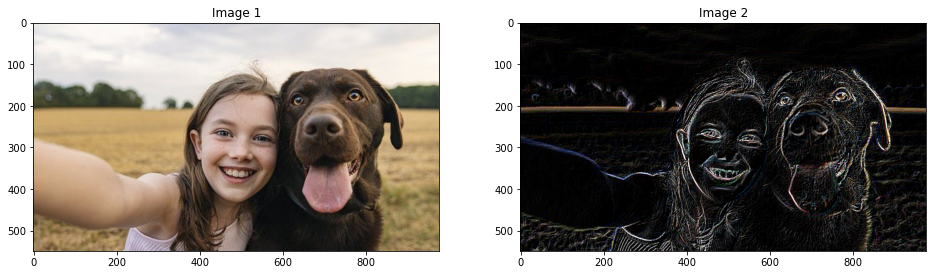

In [55]:

image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY

ShowTwoImages(image_color, image_color_edge)

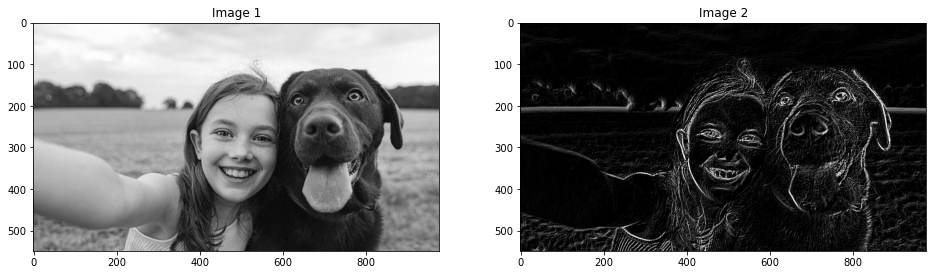

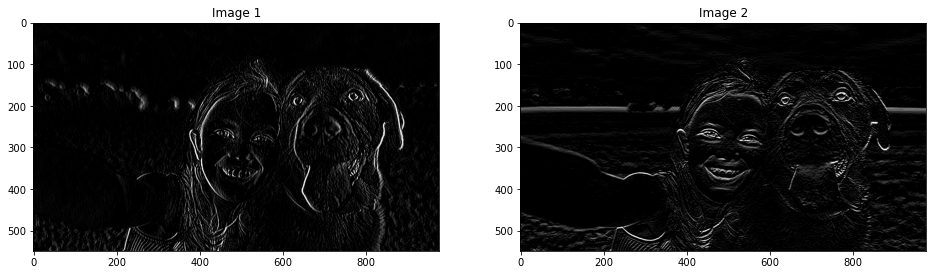

In [58]:
image_gray_edge_sobelX = cv2.filter2D(image_gray, -1, kernel_sobelX)
image_gray_edge_sobelY = cv2.filter2D(image_gray, -1, kernel_sobelY)
image_gray_edge = image_gray_edge_sobelX + image_gray_edge_sobelY

ShowTwoImages(image_gray, image_gray_edge)
ShowTwoImages(image_gray_edge_sobelX, image_gray_edge_sobelY)

### Làm mờ ảnh bằng GaussianBlur sau đó dùng phép trừ để tách nền

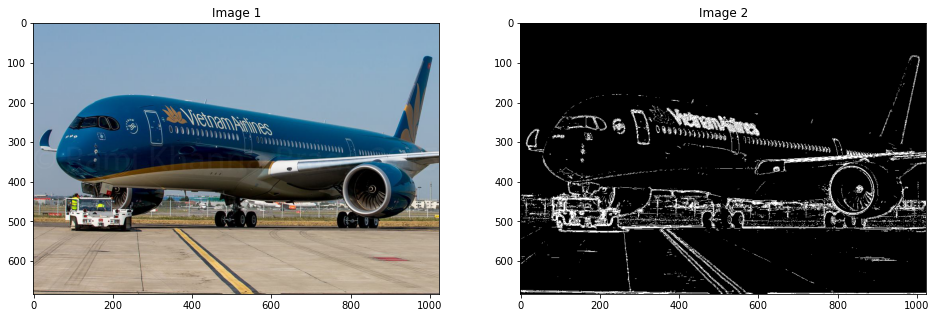

In [68]:

image = imread('May_bay.jpg')


gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Sử dụng phép trừ để tách nền (background subtraction)
blurred = cv2.GaussianBlur(gray, (15, 15), 0)

foreground = cv2.absdiff(gray, blurred)

#  tạo ra ảnh đen trắng (binary)
_, thresholded = cv2.threshold(foreground, 30, 255, cv2.THRESH_BINARY)


ShowTwoImages(image, thresholded)

